# Maschinelles Lernen 1
# Übungsprojekt: Klassifizierung
----
### (Matrikelnummern: 67641, 77573, 67610, 77587 )
----

# 1. Übersicht der Daten und Datenbereinigung
----
### 1.1 Imports der benötigten Bibliotheken und Einlesen der Datei

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import datetime

In [2]:
sensor_df = pd.read_csv(
    'train.csv', usecols=['Datum', 'Temperatur', 'Luftfeuchtigkeit',
                          'CO2', 'Wassergehalt', 'Anwesenheit'],
    index_col='Datum', parse_dates=True)

sensor_df

,Temperatur,Luftfeuchtigkeit,CO2,Wassergehalt,Anwesenheit
Datum,,,,,
2017-01-25 17:51:00,23.18,27.2720,721.25,0.004793,1
2017-01-25 17:51:59,23.15,27.2675,714.00,0.004783,1
2017-01-25 17:53:00,23.15,27.2450,713.50,0.004779,1
2017-01-25 17:54:00,23.15,27.2000,708.25,0.004772,1
2017-01-25 17:55:00,23.10,27.2000,704.50,0.004757,1
...,...,...,...,...,...
2017-02-03 23:55:59,20.10,33.5900,505.00,0.004890,0
2017-02-03 23:57:00,20.00,33.5000,504.50,0.004847,0
2017-02-03 23:57:59,20.00,33.5000,500.50,0.004847,0


### 1.2 Datentypen der Spalten

In [3]:
sensor_df.dtypes

Temperatur          float64
Luftfeuchtigkeit    float64
CO2                 float64
Wassergehalt        float64
Anwesenheit           int64
dtype: object

In [4]:
sensor_df.index.dtype

dtype('<M8[ns]')

In [5]:
sensor_df.sort_index(inplace=True)

In [6]:
sensor_df.head()

,Temperatur,Luftfeuchtigkeit,CO2,Wassergehalt,Anwesenheit
Datum,,,,,
2017-01-23 14:19:00,23.7000,26.272,749.200000,0.004764,1
2017-01-23 14:19:59,23.7180,26.290,760.400000,0.004773,1
2017-01-23 14:21:00,23.7300,26.230,769.666667,0.004765,1
2017-01-23 14:22:00,23.7225,26.125,774.750000,0.004744,1
2017-01-23 14:23:00,23.7540,26.200,779.000000,0.004767,1



### 1.3 Fehlende Werte (NaN) finden und ersetzen/entfernen

In [7]:
sensor_df.isna().sum()

Temperatur          5
Luftfeuchtigkeit    7
CO2                 4
Wassergehalt        0
Anwesenheit         0
dtype: int64

In [8]:
# wo fehlen die Werte? zufällig oder im bestimmten Zeitraum
sensor_df[sensor_df['Temperatur'].isna()]

,Temperatur,Luftfeuchtigkeit,CO2,Wassergehalt,Anwesenheit
Datum,,,,,
2017-01-25 10:05:00,NaN,25.7180,1062.8,0.004607,1
2017-01-26 11:00:59,NaN,26.5000,1047.0,0.004359,1
2017-01-28 08:35:00,NaN,19.4725,453.5,0.002752,0
2017-01-30 06:48:00,NaN,26.2000,461.5,0.003620,0
2017-02-01 20:38:00,NaN,29.5000,499.0,0.004507,0


In [9]:
sensor_df[sensor_df['Temperatur'].isna()].index

DatetimeIndex(['2017-01-25 10:05:00', '2017-01-26 11:00:59',
               '2017-01-28 08:35:00', '2017-01-30 06:48:00',
               '2017-02-01 20:38:00'],
              dtype='datetime64[ns]', name='Datum', freq=None)

In [10]:
# hier auch kein Muster zu erkennen
sensor_df[sensor_df['Luftfeuchtigkeit'].isna()]

,Temperatur,Luftfeuchtigkeit,CO2,Wassergehalt,Anwesenheit
Datum,,,,,
2017-01-24 22:47:59,20.8900,NaN,575.200000,0.003875,0
2017-01-27 11:38:00,21.7000,NaN,801.000000,0.003276,1
2017-01-27 19:51:00,20.5000,NaN,484.000000,0.002869,0
2017-01-28 12:11:59,22.8900,NaN,453.666667,0.003037,0
2017-01-29 16:57:00,19.4175,NaN,423.000000,0.003772,0
2017-01-30 07:31:00,19.5000,NaN,467.000000,0.003654,0
2017-02-02 19:24:00,21.4450,NaN,572.000000,0.004511,0


In [11]:
sensor_df[sensor_df['CO2'].isna()]

,Temperatur,Luftfeuchtigkeit,CO2,Wassergehalt,Anwesenheit
Datum,,,,,
2017-01-26 01:58:00,21.05,25.05,NaN,0.003861,0
2017-01-26 20:30:00,21.20,19.39,NaN,0.003012,0
2017-01-29 20:22:00,19.39,27.50,NaN,0.003825,0
2017-01-31 00:46:00,20.29,33.00,NaN,0.004861,0


#### 1.3.1 NaN-Werte werden ersetzt

In [12]:
# da man fast jede Minute einen neuen Messwert hat, 
# wird der letzte Messwert genommen und NaN dadurch ersetzt
sensor_df['Temperatur'].fillna(method='ffill', inplace=True)
sensor_df['CO2'].fillna(method='ffill', inplace=True)
sensor_df['Luftfeuchtigkeit'].fillna(method='ffill', inplace=True)

In [13]:
# NaN erfolgreich ersetzt
sensor_df.isna().sum()

Temperatur          0
Luftfeuchtigkeit    0
CO2                 0
Wassergehalt        0
Anwesenheit         0
dtype: int64

### 1.4 Weitere Datenerkundung und Korrelationen zwischen Features

In [14]:
sensor_df.describe()

,Temperatur,Luftfeuchtigkeit,CO2,Wassergehalt,Anwesenheit
count,14241.000000,14241.000000,14241.000000,14241.000000,14241.000000
mean,21.005552,25.939875,628.011687,0.003995,0.256513
std,1.149082,4.581694,279.315087,0.000754,0.436724
min,19.000000,16.745000,412.750000,0.002674,0.000000
25%,20.290000,22.675000,446.000000,0.003441,0.000000
50%,20.840000,25.722500,512.000000,0.003918,0.000000
75%,21.700000,28.650000,694.500000,0.004524,1.000000
max,24.408333,39.117500,2028.500000,0.006476,1.000000


Da wir nicht so viele Daten haben, nicht so viele Spalten und auch nicht sehr viele Zeilen, kann man hier einen Pairplot nehmen um die Abhängigkeiten zwischen Spalten zu zeigen.

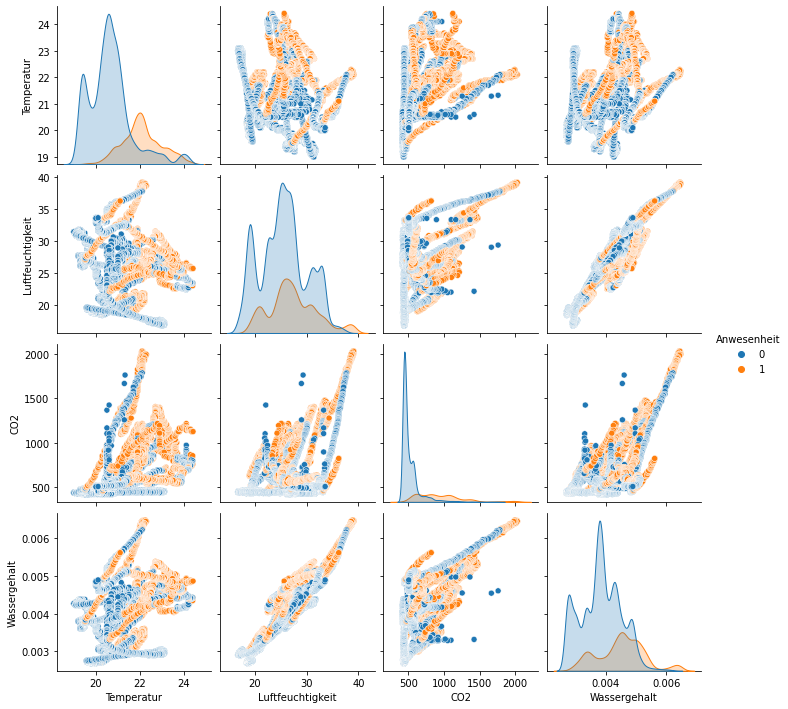

In [15]:
sns.pairplot(sensor_df, hue='Anwesenheit')

Wir vermuten dass sobald die Temperatur steigt, auch die Wahrscheinlichkeit steigt, dass sich eine Person im raum befindet.  
Es könnte an der Tageszeit liegen oder an der Ausstrahlung von Körperwärme

In [16]:
px.scatter(sensor_df, x=sensor_df.index, y='Temperatur', color='Anwesenheit',
           hover_data=['Luftfeuchtigkeit', 'CO2', 'Wassergehalt'])

In [17]:
px.scatter(sensor_df, x=sensor_df.index, y='CO2', color='Anwesenheit',
           hover_data=['Temperatur', 'Luftfeuchtigkeit', 'Wassergehalt'])

Entfernung der Ausreißer von CO2

In [18]:
sensor_df['CO2_diff'] = sensor_df[['CO2']].diff(axis=0)  #Erstellung der Spalte 'CO2_diff'

In [19]:
sensor_df[sensor_df['CO2_diff'] < sensor_df['CO2_diff'].quantile(0.75)]

,Temperatur,Luftfeuchtigkeit,CO2,Wassergehalt,Anwesenheit,CO2_diff
Datum,,,,,,
2017-01-23 14:25:59,23.754000,26.290000,797.000000,0.004783,1,-1.000000
2017-01-23 14:45:59,23.600000,27.390000,963.000000,0.004938,1,2.000000
2017-01-23 14:47:00,23.600000,27.412000,958.600000,0.004942,1,-4.400000
2017-01-23 14:50:00,23.600000,27.600000,978.428571,0.004977,1,-0.821429
2017-01-23 14:54:00,23.616667,27.633333,999.500000,0.004988,1,2.300000
...,...,...,...,...,...,...
2017-02-03 23:55:00,20.025000,33.545000,509.000000,0.004861,0,1.000000
2017-02-03 23:55:59,20.100000,33.590000,505.000000,0.004890,0,-4.000000
2017-02-03 23:57:00,20.000000,33.500000,504.500000,0.004847,0,-0.500000


In [20]:
co2_q999 = sensor_df['CO2_diff'].quantile(0.999)
sensor_df.loc[sensor_df[sensor_df['CO2_diff'] > co2_q999].index, 'CO2'] = (
    sensor_df.loc[sensor_df[sensor_df['CO2_diff'] > co2_q999].index, 'CO2'] - sensor_df.loc[sensor_df[sensor_df['CO2_diff'] > co2_q999].index, 'CO2_diff']
)   # Ausreißer werden ersetzt

In [21]:
sensor_df.head()

,Temperatur,Luftfeuchtigkeit,CO2,Wassergehalt,Anwesenheit,CO2_diff
Datum,,,,,,
2017-01-23 14:19:00,23.7000,26.272,749.200000,0.004764,1,NaN
2017-01-23 14:19:59,23.7180,26.290,760.400000,0.004773,1,11.200000
2017-01-23 14:21:00,23.7300,26.230,769.666667,0.004765,1,9.266667
2017-01-23 14:22:00,23.7225,26.125,774.750000,0.004744,1,5.083333
2017-01-23 14:23:00,23.7540,26.200,779.000000,0.004767,1,4.250000


In [22]:
sensor_df.drop('CO2_diff', axis=1, inplace=True) # Hilfsspalte wird gedropt, weil sie nicht mehr von nöten ist.

### 1.5 Feature engineering

In [23]:
sensor_df['st_minute'] = (sensor_df.index.hour.astype(str) + sensor_df.index.minute.astype(str)).astype('int32') # Spalte 'st_minute' erstellt (Stunde + Minute)

In [24]:
sensor_df['ist_wochenende'] = np.where(sensor_df.index.day_of_week.isin([5, 6]), 1, 0) # Spalte 'ist_wochenende' erstellt, die aussagt, ob Wochenede ist oder nicht.

# 2. Modelle werden getestet und selektiert

In [25]:
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, KFold, RandomizedSearchCV, GridSearchCV, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report

### 2.1 Logistische Regression mit Default Hyperparametern

In [26]:
pipe = make_pipeline(
    MinMaxScaler(),
    LogisticRegression(max_iter=1000),
)

X = sensor_df.drop('Anwesenheit', axis=1)

y = sensor_df['Anwesenheit']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, train_size=0.65,random_state=42
)

In [27]:
pipe.fit(X_train, y_train).score(X_test, y_test) # Training und Score vom Modell

0.8772316950852558

In [28]:
test_preds = pipe.predict(X_test)

In [29]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, test_preds) # TruePositives, TrueNegatives, FalsePositives, FalseNegatives

array([[3471,  229],
       [ 383,  902]], dtype=int64)

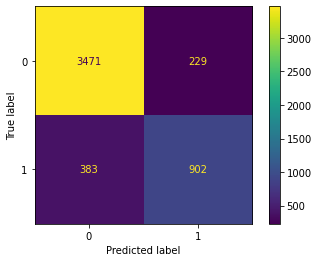

In [30]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(pipe, X_test, y_test) 

### 2.2 Optimierung der Hyperparameter von der Logistischen Regression durch Kreuzvalidierung

In [31]:
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
# Erstellung eines logistischen Regressions Objet
logistic = LogisticRegression()

# Erstellt mir eine Liste von allen C Values, die ich testen möchte
C = np.arange(2, 5, 0.1)

hyperparameters = dict(C=C, penalty=['l1', 'l2'], solver=['liblinear', 'lbfgs'])

# Fit model mit Gridsearch
clf = GridSearchCV(logistic, hyperparameters, cv=5, verbose=0)
best_model = clf.fit(X_train, y_train)

best_model.best_params_

C:\Users\Admin\anaconda3\envs\streamlitApp\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\Admin\anaconda3\envs\streamlitApp\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning:


150 fits failed out of a total of 600.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
150 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Admin\anaconda3\envs\streamlitApp\lib\site-packages\sklearn\model_selection\_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Admin\anaconda3\envs\streamlitApp\lib\site-packages\sklearn\linear_model\_logi

{'C': 4.700000000000003, 'penalty': 'l1', 'solver': 'liblinear'}

In [32]:
# Logreg mit den besten Parametern
logreg_pipe = make_pipeline(
    MinMaxScaler(),
    LogisticRegression(penalty='l1', solver='liblinear', max_iter=500, C=4.9),
)


X_train, X_test, y_train, y_test = train_test_split(
    X, y, train_size=0.65,random_state=42
)

In [33]:
from sklearn.metrics import roc_curve
logreg_pipe.fit(X_train, y_train).score(X_test, y_test)


0.8784353059177532

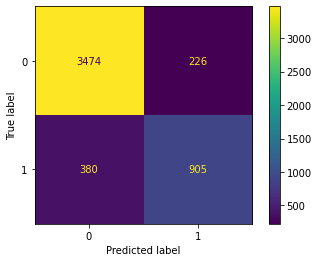

In [34]:
logreg_preds = logreg_pipe.predict(X_test)
ConfusionMatrixDisplay.from_estimator(logreg_pipe, X_test, y_test) 

In [35]:
print(classification_report(y_test,logreg_preds))

              precision    recall  f1-score   support

           0       0.90      0.94      0.92      3700
           1       0.80      0.70      0.75      1285

    accuracy                           0.88      4985
   macro avg       0.85      0.82      0.83      4985
weighted avg       0.88      0.88      0.88      4985



Support Vektorklassifikation mit Defaultparametern

In [36]:
svc_pipe_default = make_pipeline(
    MinMaxScaler(),
    SVC(random_state=0, probability=True),
)

svc_pipe_default.fit(X_train, y_train).score(X_test, y_test)

0.9462387161484453

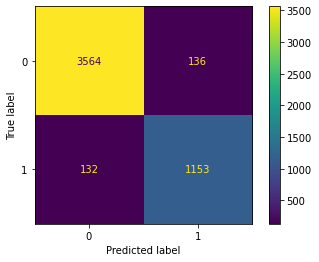

In [37]:
ConfusionMatrixDisplay.from_estimator(svc_pipe_default, X_test, y_test) 

Support Vektorklassifikation mit Optimierung durch Kreuzvalidierung

In [38]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, train_size=0.65,random_state=42
)

scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)

param_grid = {'C': [0.1, 1, 10, 100],
              'gamma':['scale', 'auto'],
              'kernel': ['linear']}
svc_grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3,n_jobs=-1)
svc_grid.fit(X_train, y_train)
X_test = scaler.transform(X_test)
print(svc_grid.best_params_) 
grid_predictions = svc_grid.predict(X_test) 
   
# print classification report 
print(classification_report(y_test, grid_predictions)) 

Fitting 5 folds for each of 8 candidates, totalling 40 fits
{'C': 100, 'gamma': 'scale', 'kernel': 'linear'}
              precision    recall  f1-score   support

           0       0.91      0.93      0.92      3700
           1       0.79      0.74      0.76      1285

    accuracy                           0.88      4985
   macro avg       0.85      0.83      0.84      4985
weighted avg       0.88      0.88      0.88      4985



In [39]:
svc_pipe = make_pipeline(
    MinMaxScaler(),
    SVC(C=100, gamma='scale', kernel='linear'),
)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, train_size=0.65,random_state=42
)

svc_pipe.fit(X_train, y_train).score(X_test, y_test)

0.8804413239719158

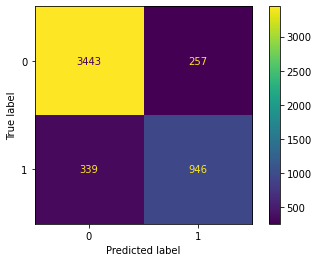

In [40]:
ConfusionMatrixDisplay.from_estimator(svc_pipe, X_test, y_test) 

In [41]:
dtree = DecisionTreeClassifier(random_state=42)
dtree.fit(X_train,y_train)

DecisionTreeClassifier(random_state=42)

In [42]:
dtree.score(X_test,y_test)

0.9857572718154464

In [43]:
predictions = dtree.predict(X_test)
confusion_matrix(y_test,predictions)

array([[3677,   23],
       [  48, 1237]], dtype=int64)

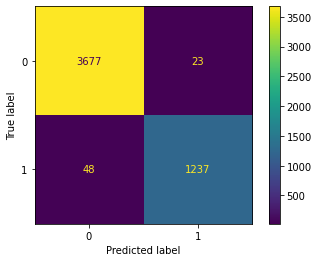

In [44]:
ConfusionMatrixDisplay.from_estimator(dtree, X_test, y_test) 

In [45]:
sensor_df['anwesenheit_pred_svc'] = svc_pipe.predict(X)

In [53]:
test_df = pd.read_csv(
    'test.csv', usecols=['Datum', 'Temperatur', 'Luftfeuchtigkeit',
                          'CO2', 'Wassergehalt'],
    index_col='Datum', parse_dates=True)

test_df.head()

,Temperatur,Luftfeuchtigkeit,CO2,Wassergehalt
Datum,,,,
2017-02-04 00:01:00,20.050000,33.545000,507.000000,0.004869
2017-02-04 00:02:00,20.033333,33.626667,505.333333,0.004875
2017-02-04 00:03:00,20.000000,33.590000,505.500000,0.004860
2017-02-04 00:04:00,20.000000,33.645000,504.500000,0.004868
2017-02-04 00:04:59,20.000000,33.626667,504.666667,0.004865


In [54]:
test_df['st_minute'] = (test_df.index.hour.astype(str) + test_df.index.minute.astype(str)).astype('int32')
test_df['ist_wochenende'] = np.where(test_df.index.day_of_week.isin([5, 6]), 1, 0)
test_df

,Temperatur,Luftfeuchtigkeit,CO2,Wassergehalt,st_minute,ist_wochenende
Datum,,,,,,
2017-02-04 00:01:00,20.050000,33.545000,507.000000,0.004869,1,1
2017-02-04 00:02:00,20.033333,33.626667,505.333333,0.004875,2,1
2017-02-04 00:03:00,20.000000,33.590000,505.500000,0.004860,3,1
2017-02-04 00:04:00,20.000000,33.645000,504.500000,0.004868,4,1
2017-02-04 00:04:59,20.000000,33.626667,504.666667,0.004865,4,1
...,...,...,...,...,...,...
2017-02-08 09:15:00,20.815000,27.717500,1505.250000,0.004213,915,0
2017-02-08 09:16:00,20.865000,27.745000,1514.500000,0.004230,916,0
2017-02-08 09:16:59,20.890000,27.745000,1521.500000,0.004237,916,0


In [56]:
test_df.isna().sum()

Temperatur          3
Luftfeuchtigkeit    1
CO2                 3
Wassergehalt        0
st_minute           0
ist_wochenende      0
dtype: int64

In [57]:
test_df['Temperatur'].fillna(method='ffill', inplace=True)
test_df['CO2'].fillna(method='ffill', inplace=True)
test_df['Luftfeuchtigkeit'].fillna(method='ffill', inplace=True)

In [58]:
test_df['anwesenheit_pred_dtree'] = dtree.predict(test_df)
test_df

,Temperatur,Luftfeuchtigkeit,CO2,Wassergehalt,st_minute,ist_wochenende,anwesenheit_pred_dtree
Datum,,,,,,,
2017-02-04 00:01:00,20.050000,33.545000,507.000000,0.004869,1,1,0
2017-02-04 00:02:00,20.033333,33.626667,505.333333,0.004875,2,1,0
2017-02-04 00:03:00,20.000000,33.590000,505.500000,0.004860,3,1,0
2017-02-04 00:04:00,20.000000,33.645000,504.500000,0.004868,4,1,0
2017-02-04 00:04:59,20.000000,33.626667,504.666667,0.004865,4,1,0
...,...,...,...,...,...,...,...
2017-02-08 09:15:00,20.815000,27.717500,1505.250000,0.004213,915,0,1
2017-02-08 09:16:00,20.865000,27.745000,1514.500000,0.004230,916,0,1
2017-02-08 09:16:59,20.890000,27.745000,1521.500000,0.004237,916,0,1


In [59]:
test_df.describe()

,Temperatur,Luftfeuchtigkeit,CO2,Wassergehalt,st_minute,ist_wochenende,anwesenheit_pred_dtree
count,6319.000000,6319.000000,6319.000000,6319.000000,6319.00000,6319.000000,6319.000000
mean,20.682308,31.523352,831.499540,0.004753,951.05618,0.455610,0.604526
std,0.758664,3.443901,332.580525,0.000488,740.25740,0.498065,0.488991
min,19.500000,24.290000,492.750000,0.003593,0.00000,0.000000,0.000000
25%,20.100000,28.972500,544.000000,0.004455,225.00000,0.000000,0.000000
50%,20.463333,31.066667,723.000000,0.004782,830.00000,0.000000,1.000000
75%,21.129167,34.475000,965.583333,0.005154,1614.50000,1.000000,1.000000
max,23.290000,39.500000,2076.500000,0.005769,2358.00000,1.000000,1.000000


In [60]:
test_df.to_csv('test_preds.csv')

In [46]:
false_positives = sensor_df[
    (sensor_df['Anwesenheit'] != sensor_df['anwesenheit_pred_svc']) & (sensor_df['Anwesenheit'] == 0)
].shape[0]
((false_positives/60) * 5)/sensor_df.index.day.nunique()
# im Durchschnitt jeden Tag 17 Cents

4.756410256410256

In [47]:
false_negatives = sensor_df[
    (sensor_df['Anwesenheit'] != sensor_df['anwesenheit_pred_svc']) & (sensor_df['Anwesenheit'] == 1)
].shape[0]
(false_positives/60)/sensor_df.index.day.nunique()

0.9512820512820513

In [48]:
sensor_df['anwesenheit_pred_dtree'] = dtree.predict(X)
sensor_df.head()

,Temperatur,Luftfeuchtigkeit,CO2,Wassergehalt,Anwesenheit,st_minute,ist_wochenende,anwesenheit_pred_svc,anwesenheit_pred_dtree
Datum,,,,,,,,,
2017-01-23 14:19:00,23.7000,26.272,749.200000,0.004764,1,1419,0,1,1
2017-01-23 14:19:59,23.7180,26.290,760.400000,0.004773,1,1419,0,1,1
2017-01-23 14:21:00,23.7300,26.230,769.666667,0.004765,1,1421,0,1,1
2017-01-23 14:22:00,23.7225,26.125,774.750000,0.004744,1,1422,0,1,1
2017-01-23 14:23:00,23.7540,26.200,779.000000,0.004767,1,1423,0,1,1


In [49]:
false_positives = sensor_df[
    (sensor_df['Anwesenheit'] != sensor_df['anwesenheit_pred_dtree']) & (sensor_df['Anwesenheit'] == 0)
].shape[0]
((false_positives/60) * 5)/sensor_df.index.day.nunique()
# im Durchschnitt jeden Tag 17 Cents

0.14743589743589744

In [50]:
false_negatives = sensor_df[
    (sensor_df['Anwesenheit'] != sensor_df['anwesenheit_pred_dtree']) & (sensor_df['Anwesenheit'] == 1)
].shape[0]
(false_positives/60)/sensor_df.index.day.nunique()
# 

0.02948717948717949

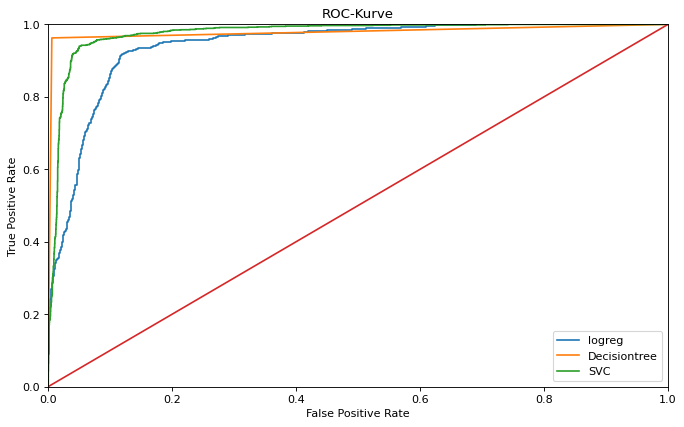

In [51]:
from sklearn.metrics import roc_curve
plt.figure(figsize = (10, 6), dpi = 80)


ypred = logreg_pipe.predict(X_test)
yprobs = logreg_pipe.predict_proba(X_test)
prob = yprobs[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, prob)
plt.plot(fpr, tpr, label = 'logreg')

predictions = dtree.predict(X_test)
dtree.score(X_test,y_test)
yprobs = dtree.predict_proba(X_test)
prob = yprobs[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, prob)
plt.plot(fpr, tpr,label = 'Decisiontree')

svc_pipe_default.fit(X_train, y_train).score(X_test, y_test)
ypred = svc_pipe_default.predict(X_test)
yprobs = svc_pipe_default.predict_proba(X_test)
prob = yprobs[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, prob)
plt.plot(fpr, tpr, label = 'SVC')


plt.title('ROC-Kurve')
plt.plot([0, 1], [0, 1] )
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend()
plt.show()